In [1]:
from pyAudioAnalysis import audioBasicIO, audioFeatureExtraction, audioAnalysis
import matplotlib.pyplot as plt
import numpy as np
import IPython

from brew_detector import get_labels, build_pipeline, save_pipeline, WindowedExtractor

%matplotlib notebook
plt.rc('figure', figsize=(12,8))
%load_ext autoreload
%autoreload 2

# Load audio, convert to mono

In [2]:
audio_filename = 'data/Trekopper.wav'
Fs, audio_stereo = audioBasicIO.readAudioFile(audio_filename)
audio_mono = audioBasicIO.stereo2mono(audio_stereo)

# Define brew times

In [3]:
t1 = (40.0, 48.0)
t2 = (121.0, 131.0)
t3 = (241.0, 249.0)
t_brew = [t1, t2, t3]

# Plot raw audio and brew times

<IPython.core.display.Javascript object>


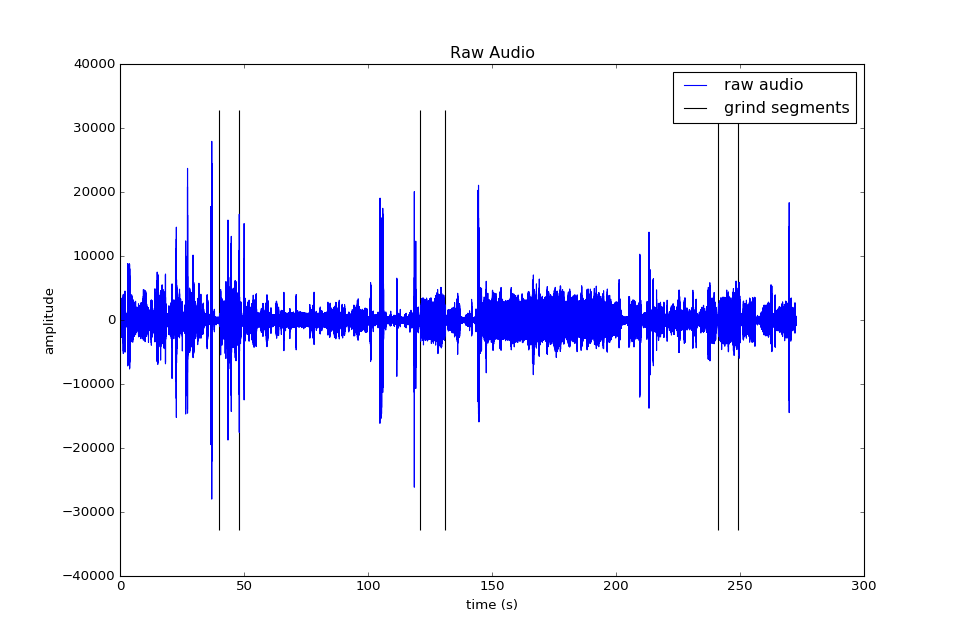

In [4]:
plt.figure()
T = np.arange(audio_mono.shape[0])/float(Fs)
plt.plot(T,audio_mono, label='raw audio')
t_brew_flat = [t for ts in zip(*t_brew) for t in ts]
plt.vlines(t_brew_flat,-2**15,2**15,label='grind segments')
plt.xlabel('time (s)')
plt.ylabel('amplitude')
plt.title('Raw Audio')
plt.legend()

# Feature extraction

<IPython.core.display.Javascript object>


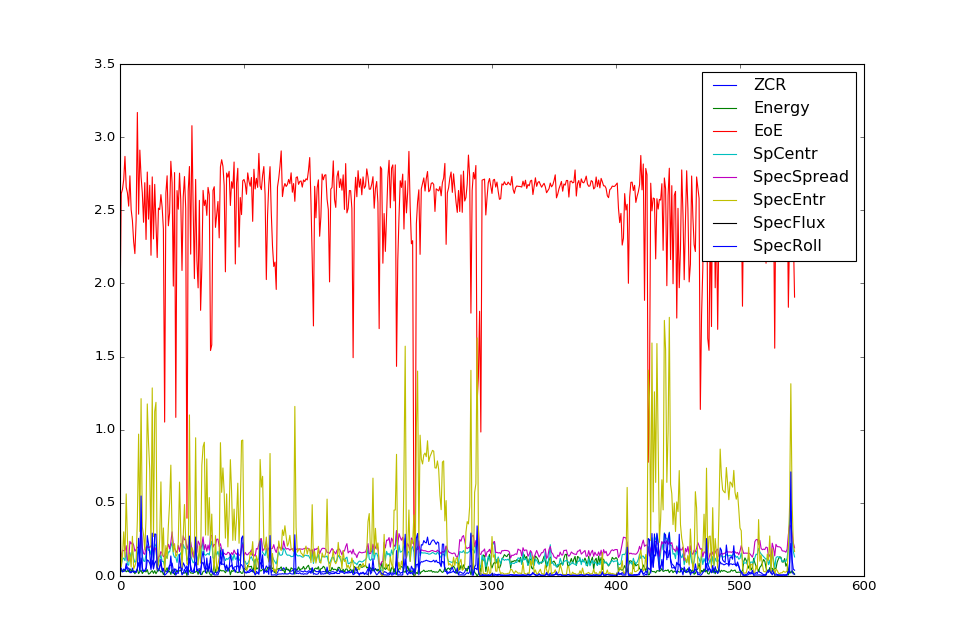

In [5]:
def plot_spectral_features(X_plot):
    plt.figure()
    labels = ['ZCR', 'Energy', 'EoE', 'SpCentr', 'SpecSpread', 'SpecEntr', 'SpecFlux', 'SpecRoll']
    for idx, l in enumerate(labels):
        plt.plot(X_plot[:, idx], label=l);
    plt.legend()

win_extractor = WindowedExtractor(Fs, win_size_sec=0.5)
X_win = win_extractor.transform(audio_mono)
plot_spectral_features(X_win)

# MFCCs

<IPython.core.display.Javascript object>


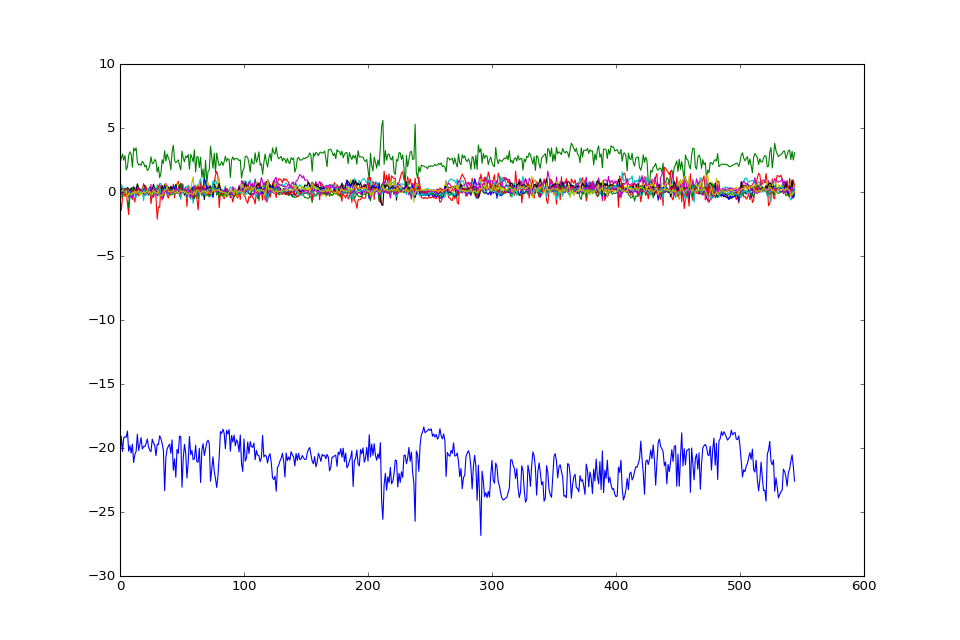

In [6]:
def plot_mfcc(X_plot):
    coefs = X_plot[:,8:21]
    plt.figure()
    plt.plot(coefs)

plot_mfcc(X_win)

# Extract labels

<IPython.core.display.Javascript object>


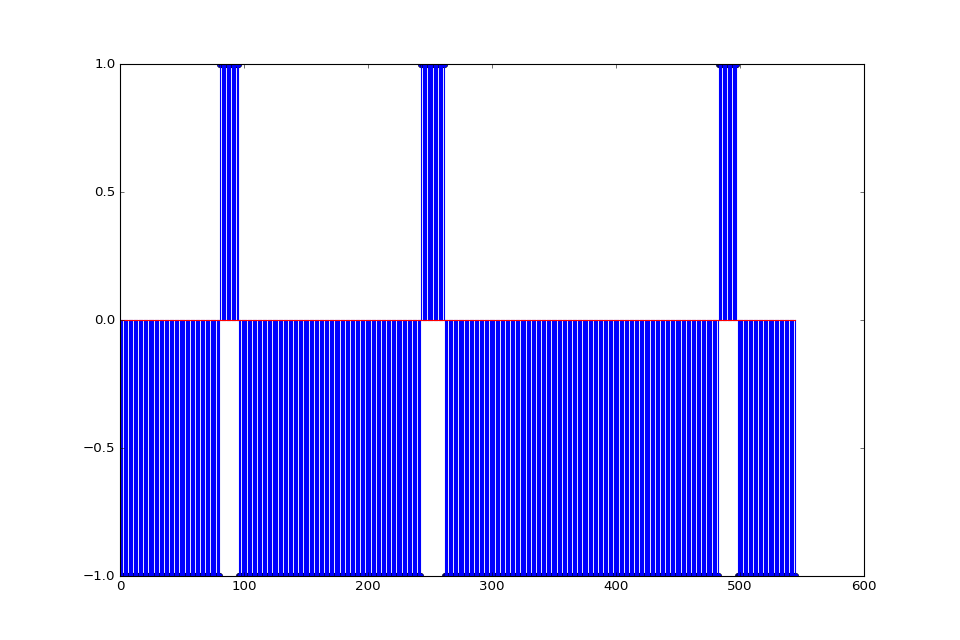

<Container object of 3 artists>

In [7]:
y = get_labels(X_win, win_extractor, t_brew)
plt.figure()
plt.stem(y)

# Scale the data

In [8]:
from sklearn import preprocessing

scaler = preprocessing.StandardScaler().fit(X_win)
X = scaler.transform(X_win)

# Visualize features

<IPython.core.display.Javascript object>


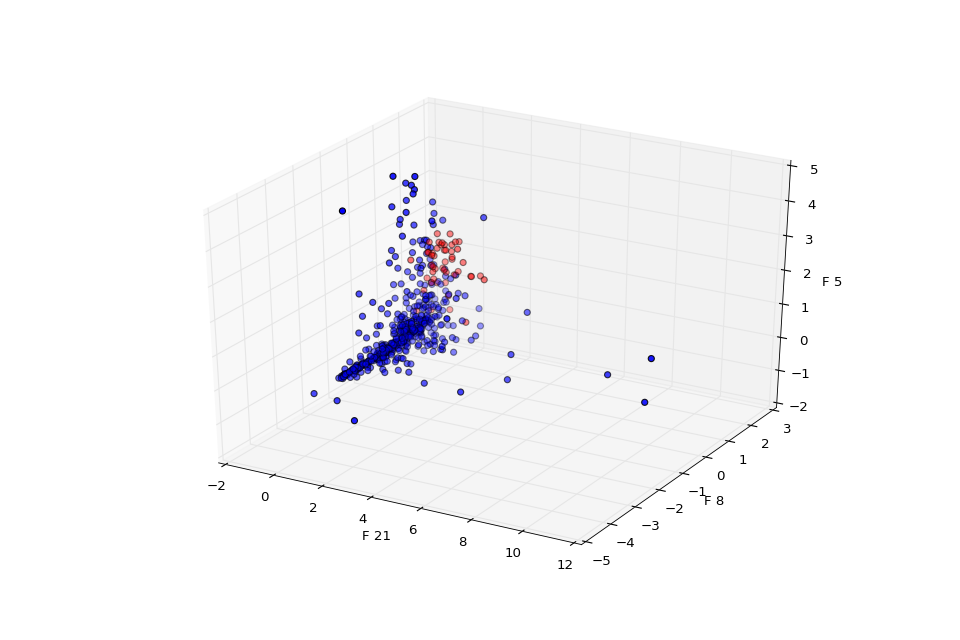

[21  8  5]


In [9]:
def vis_features_labeled(X, y, features):
    from mpl_toolkits.mplot3d import Axes3D
    X_best = X[:,features]
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    colors = map(lambda x: {-1: 'blue', 1: 'red'}[x], y)
    markers = map(lambda x: {-1: 'x', 1: '^'}, y)
    ax.scatter(X_best[:,0], X_best[:,1], X_best[:,2], c=colors, s=30)
    ax.set_xlabel('F {}'.format(features[0]))
    ax.set_ylabel('F {}'.format(features[1]))
    ax.set_zlabel('F {}'.format(features[2]))
    
rand_features = np.random.choice(np.arange(X.shape[1]), size=3, replace=False)
vis_features_labeled(X, y, rand_features)
print(rand_features)

<IPython.core.display.Javascript object>


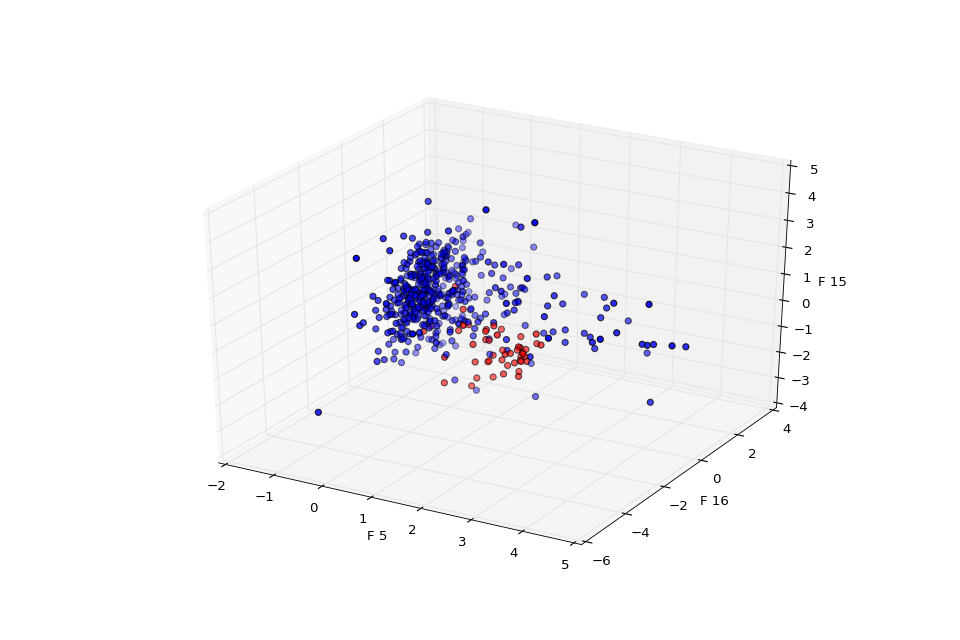

In [10]:
some_dope_features = [5, 16, 15]
vis_features_labeled(X, y, some_dope_features)

# Train a linear SVM classifier

In [11]:
from sklearn import svm, linear_model
from sklearn.model_selection import train_test_split, cross_val_score, StratifiedKFold
clf = svm.SVC(kernel='linear', probability=True)
cross_val_score(clf, X, y, cv=3)

array([ 0.93442623,  0.97790055,  0.96685083])

# Feature selection

Optimal number of features : 3
Ranking: [ 2 14 16  6  3  9 20 10  1  1  8 17 13  5  1 15 11 12  4 19  7 18]


<IPython.core.display.Javascript object>


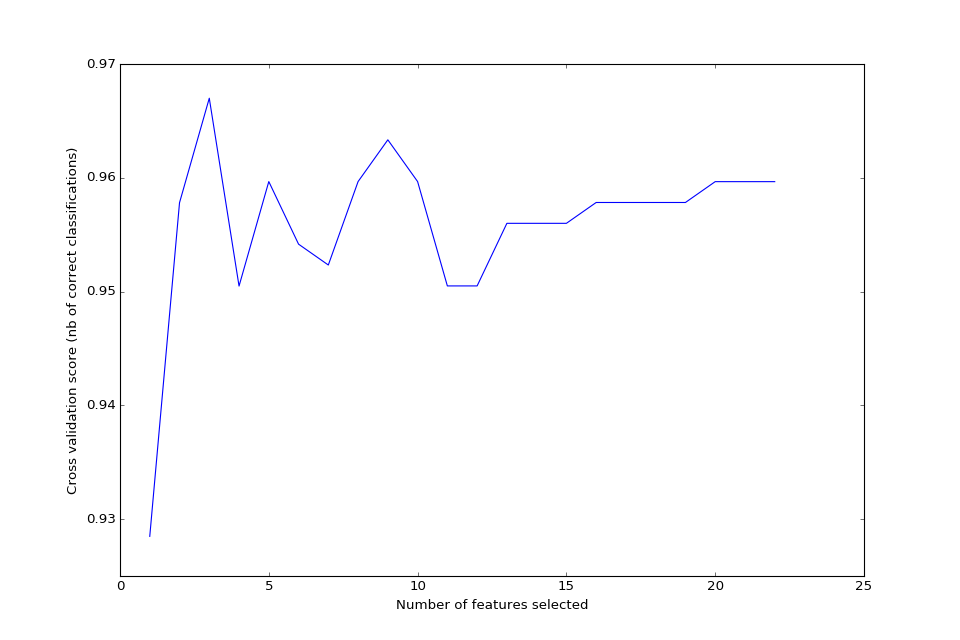

In [12]:
from sklearn.feature_selection import RFECV
rfecv = RFECV(estimator=clf, step=1, cv=StratifiedKFold(2), scoring='accuracy')
rfecv.fit(X,y)
print("Optimal number of features : %d" % rfecv.n_features_)
print('Ranking: {}'.format(rfecv.ranking_))

# Plot number of features VS. cross-validation scores
plt.figure()
plt.xlabel("Number of features selected")
plt.ylabel("Cross validation score (nb of correct classifications)")
plt.plot(range(1, len(rfecv.grid_scores_) + 1), rfecv.grid_scores_)
plt.show()

# Visualize some good features

<IPython.core.display.Javascript object>


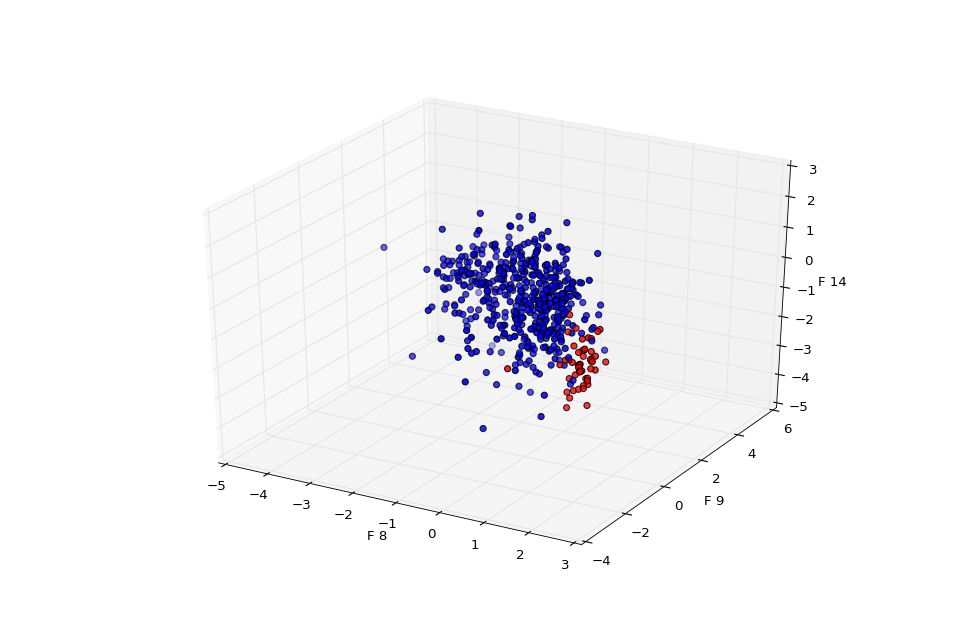

In [13]:
good_features = np.arange(rfecv.support_.shape[0])[rfecv.support_]
vis_features_labeled(X, y, good_features)

# Define pipeline

In [14]:
kaffe_pipeline = build_pipeline(win_extractor)
kaffe_pipeline.fit(audio_mono, y)

Pipeline(steps=[('raw', <brew_detector.WindowedExtractor object at 0x10d91d850>), ('scaler', StandardScaler(copy=True, with_mean=True, with_std=True)), ('classify', SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
  decision_function_shape=None, degree=3, gamma='auto', kernel='rbf',
  max_iter=-1, probability=False, random_state=None, shrinking=True,
  tol=0.001, verbose=False))])

# Predict on a test set

In [15]:
test_file = 'data/brygg.wav'
#IPython.display.Audio(test_file)

<IPython.core.display.Javascript object>


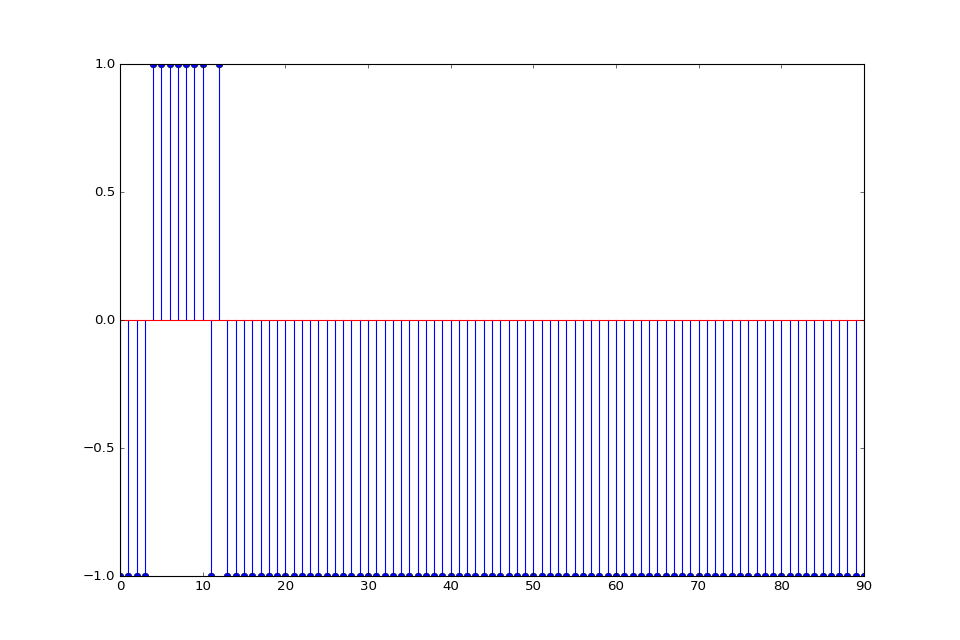

<Container object of 3 artists>

In [16]:
_, test_audio_stereo = audioBasicIO.readAudioFile(test_file)
test_audio_mono = audioBasicIO.stereo2mono(test_audio_stereo)
test_labels = kaffe_pipeline.predict(test_audio_mono)
plt.figure()
plt.stem(test_labels)

# Moving average

<IPython.core.display.Javascript object>


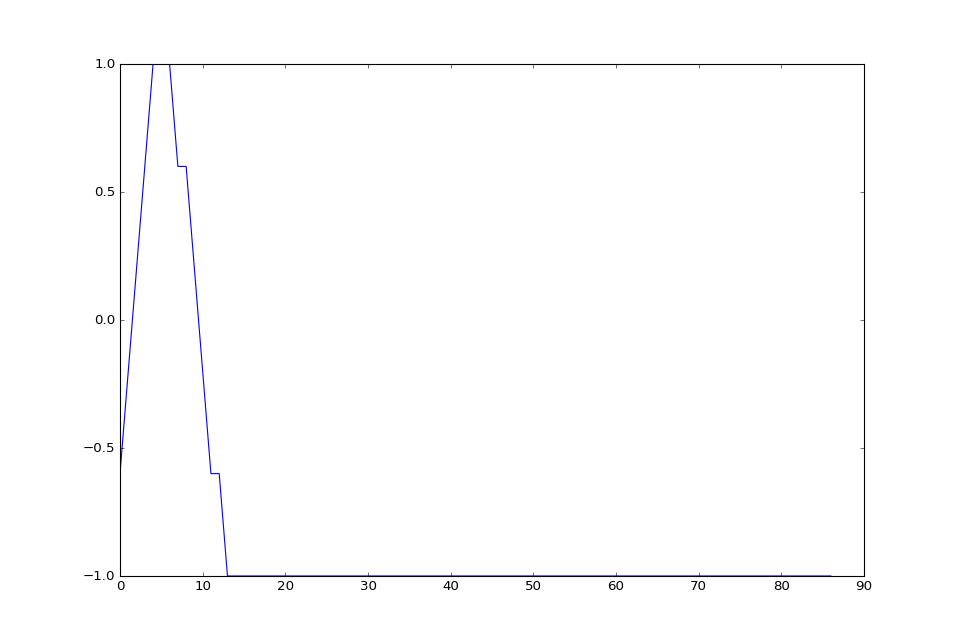

In [17]:
def moving_average(a, n):
    ret = np.cumsum(a, dtype=float)
    ret[n:] = ret[n:] - ret[:-n]
    return ret[n - 1:] / n

labels_ma = moving_average(test_labels, n=5)
plt.figure()
plt.plot(labels_ma)
plt.show()

# Save pipeline

In [18]:
save_pipeline(kaffe_pipeline)